In [74]:
import os
import numpy as np
import torch
from functools import partial
from collections import defaultdict
import pandas as pd
import argparse
import sys
from PIL import Image
import pickle as pkl
import seaborn as sns
import matplotlib.pyplot as plt

from utils import load_tl_model
import circuitsvis as cv

from das import DasDataset

sys.path.append("./TransformerLens/")

import transformer_lens.utils as utils

In [2]:
comp_str = "256-256-256"
task = "discrimination"
pretrain = "clip"
ds = "NOISE_RGB"
obj_size=32
run_id = "n1wy4pyq"
patch_size=16

model_path = f"./models/{task}/{pretrain}/{ds}_{obj_size}/{comp_str}_{run_id}.pth"
image_processor, tl_model = load_tl_model(model_path, pretrain, patch_size)

torch.set_grad_enabled(False)

If using ViT for interpretability research, keep in mind that ViT has some significant architectural differences to GPT. For example, LayerNorms are applied *after* the attention and MLP components, meaning that the last LayerNorm in a block cannot be folded.
/gpfs/data/epavlick/mlepori/miniconda3/envs/relational-circuits/lib/python3.9/site-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


Moving model to device:  cuda
Loaded pretrained model openai/clip-vit-base-patch16 into HookedTransformer
Moving model to device:  cuda


In [112]:
stim_dir = f"stimuli/das/{task}/trainsize_6400_{comp_str}/shape_32/train"
stim_dict = pkl.load(open(os.path.join(stim_dir, "datadict.pkl"), "rb"))

In [126]:
image = "diff_set_7"
im_dict = stim_dict[image]
im = Image.open(os.path.join(stim_dir, image, "base.png"))
item = image_processor(
                images=np.array(im, dtype=np.float32), return_tensors="pt"
            )["pixel_values"][0].to("cuda")


In [127]:
logits, cache = tl_model.run_with_cache(item.unsqueeze(0), remove_batch_dim=True)

torch.Size([12, 197, 197])
OBJ 1 HEATMAP
OBJ 2 HEATMAP


<Axes: >

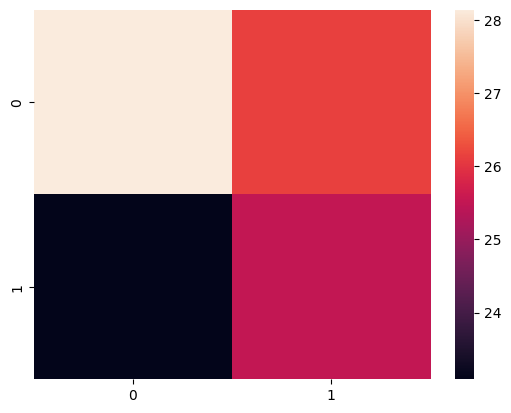

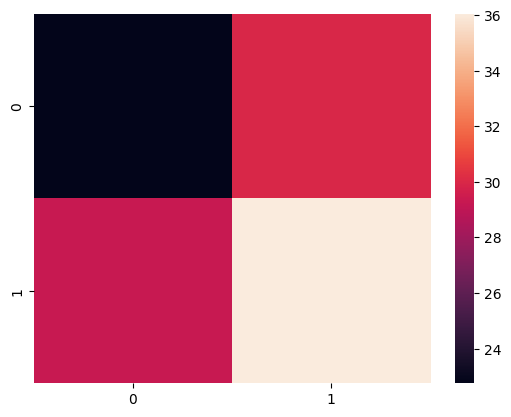

In [129]:
attention_pattern = cache["pattern", 5, "attn"] # num head, dest position, source position
print(attention_pattern.shape)

obj_1 = torch.tensor([idx + 1 for idx in im_dict["edited_pos"]])
obj_2 = torch.tensor([idx + 1 for idx in im_dict["non_edited_pos"]])

not_obj_1 = torch.tensor(list(set(range(attention_pattern.shape[1])) - set([idx + 1 for idx in im_dict["edited_pos"]])))
not_obj_2 = torch.tensor(list(set(range(attention_pattern.shape[1])) - set([idx + 1 for idx in im_dict["non_edited_pos"]])))

# Gets total attention paid to obj 1 from all tokens not in obj 1

obj_1_attention_pattern = attention_pattern.sum(dim=0)[not_obj_1].sum(dim=0) # gets total attention paid to each token
# Vice versa
obj_2_attention_pattern = attention_pattern.sum(dim=0)[not_obj_2].sum(dim=0) # gets total attention paid to each token


obj_1 = obj_1_attention_pattern[obj_1] # Get rid of CLS token
print("OBJ 1 HEATMAP")
sns.heatmap(obj_1.reshape(2, 2).cpu())

plt.figure()
obj_2 = obj_2_attention_pattern[obj_2] # Get rid of CLS token
print("OBJ 2 HEATMAP")
sns.heatmap(obj_2.reshape(2, 2).cpu())

In [66]:
attention_pattern = cache["pattern", 4, "attn"] # num head, dest position, source position
print(attention_pattern.shape)
relevant_indices = [0] + [idx + 1 for idx in im_dict["edited_pos"]] + [idx + 1 for idx in im_dict["non_edited_pos"]]
tokens = [str(i) for i in range(attention_pattern.shape[1])]
#tokens = [str(i) for i in relevant_indices]
#relevant_indices_columns = torch.tensor(relevant_indices).repeat(len(relevant_indices))
#relevant_indices_rows = torch.tensor(relevant_indices).repeat_interleave(len(relevant_indices))
cv.attention.attention_patterns(tokens=tokens, attention=attention_pattern)

torch.Size([12, 197, 197])


In [67]:
R = 10
C = 3
print((R * 14) + C)
im_dict

143


{'edited_pos': [14, 15, 28, 29],
 'non_edited_pos': [54, 55, 68, 69],
 'cf_pos': [10, 11, 24, 25],
 'cf_other_object_pos': [19, 20, 33, 34],
 'label': 1}